In [18]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


# Read the Excel file
file_path = ".\\datasets\\concrete\\Concrete_Data.xls"
data = pd.read_excel(file_path)

In [19]:
# Rename columns to be more concise
data.columns = ['Cement', 'Blast Furnace Slag', 'Fly Ash', 'Water', 'Superplasticizer', 'Coarse Aggregate', 'Fine Aggregate', 'Age', 'Concrete Compressive Strength']

target = data.columns[-1]

In [20]:
missing_entries = data.isnull().sum()
missing_entries

Cement                           0
Blast Furnace Slag               0
Fly Ash                          0
Water                            0
Superplasticizer                 0
Coarse Aggregate                 0
Fine Aggregate                   0
Age                              0
Concrete Compressive Strength    0
dtype: int64

In [21]:
# Display the first few rows of the dataframe
data.describe()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete Compressive Strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.165631,73.895485,54.187136,181.566359,6.203112,972.918592,773.578883,45.662136,35.817836
std,104.507142,86.279104,63.996469,21.355567,5.973492,77.753818,80.175427,63.169912,16.705679
min,102.000000,0.000000,0.000000,121.750000,0.000000,801.000000,594.000000,1.000000,2.331808
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.707115
50%,272.900000,22.000000,0.000000,185.000000,6.350000,968.000000,779.510000,28.000000,34.442774
75%,350.000000,142.950000,118.270000,192.000000,10.160000,1029.400000,824.000000,56.000000,46.136287
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.599225


In [22]:
def standardize_data(data):
    # Calculate the mean and standard deviation for each column
    means = data.mean()
    stds = data.std()

    # Apply z-score standardization
    standardized = (data - means) / stds

    # Display the first few rows of the standardized data
    return standardized

# Call the function
standardized_data = standardize_data(data)
standardized_data.describe()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete Compressive Strength
count,1.030000e+03,1.030000e+03,1.030000e+03,1.030000e+03,1.030000e+03,1.030000e+03,1.030000e+03,1.030000e+03,1.030000e+03
mean,6.898473e-17,-9.657862e-17,-1.103756e-16,3.035328e-16,-5.518779e-17,2.207511e-16,-2.000557e-16,4.139084e-17,2.759389e-16
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-1.714386e+00,-8.564702e-01,-8.467207e-01,-2.800973e+00,-1.038440e+00,-2.211063e+00,-2.239824e+00,-7.070160e-01,-2.004470e+00
25%,-8.496130e-01,-8.564702e-01,-8.467207e-01,-7.804222e-01,-1.038440e+00,-5.262583e-01,-5.316951e-01,-6.120340e-01,-7.249463e-01
50%,-7.909154e-02,-6.014838e-01,-8.467207e-01,1.607843e-01,2.459003e-02,-6.325853e-02,7.397674e-02,-2.795973e-01,-8.231107e-02
75%,6.586571e-01,8.003620e-01,1.001350e+00,4.885677e-01,6.624079e-01,7.264133e-01,6.288849e-01,1.636517e-01,6.176613e-01
max,2.476715e+00,3.309081e+00,2.280014e+00,3.064009e+00,4.352042e+00,2.213157e+00,2.731774e+00,5.055221e+00,2.800328e+00


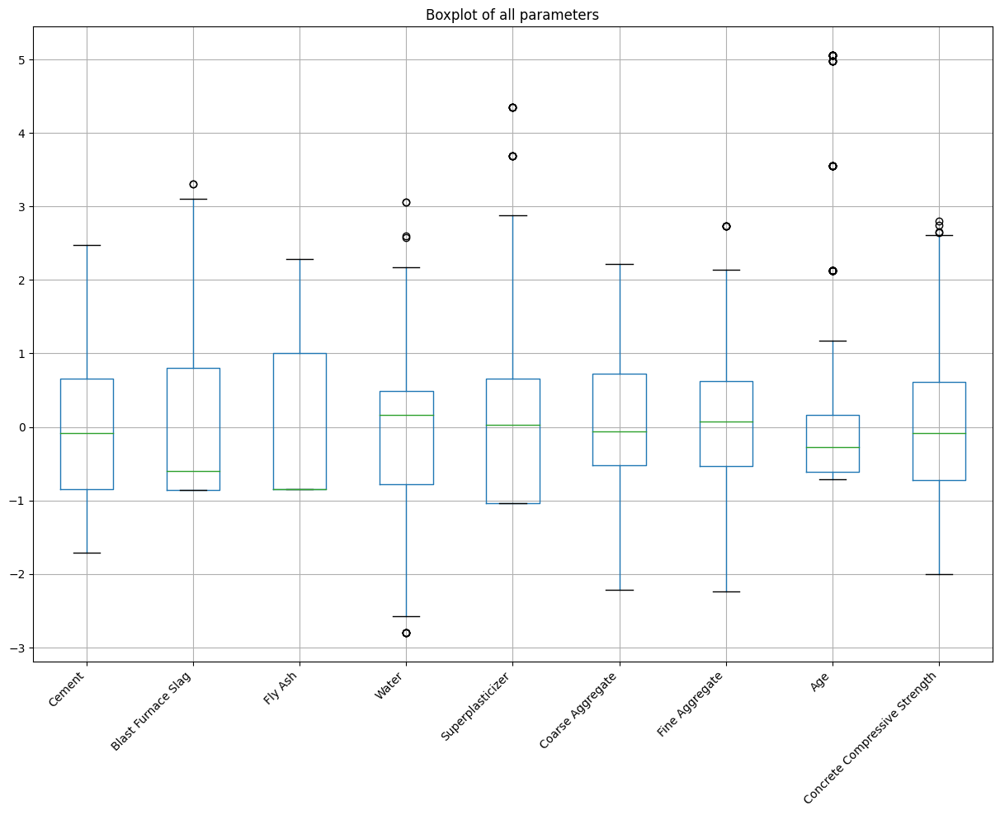

In [23]:
# Create a boxplot for all parameters
plt.figure(figsize=(15, 10))
standardized_data.boxplot()
plt.xticks(rotation=45, ha='right')
plt.title('Boxplot of all parameters')
plt.show()

In [24]:
data.columns

Index(['Cement', 'Blast Furnace Slag', 'Fly Ash', 'Water', 'Superplasticizer',
       'Coarse Aggregate', 'Fine Aggregate', 'Age',
       'Concrete Compressive Strength'],
      dtype='object')

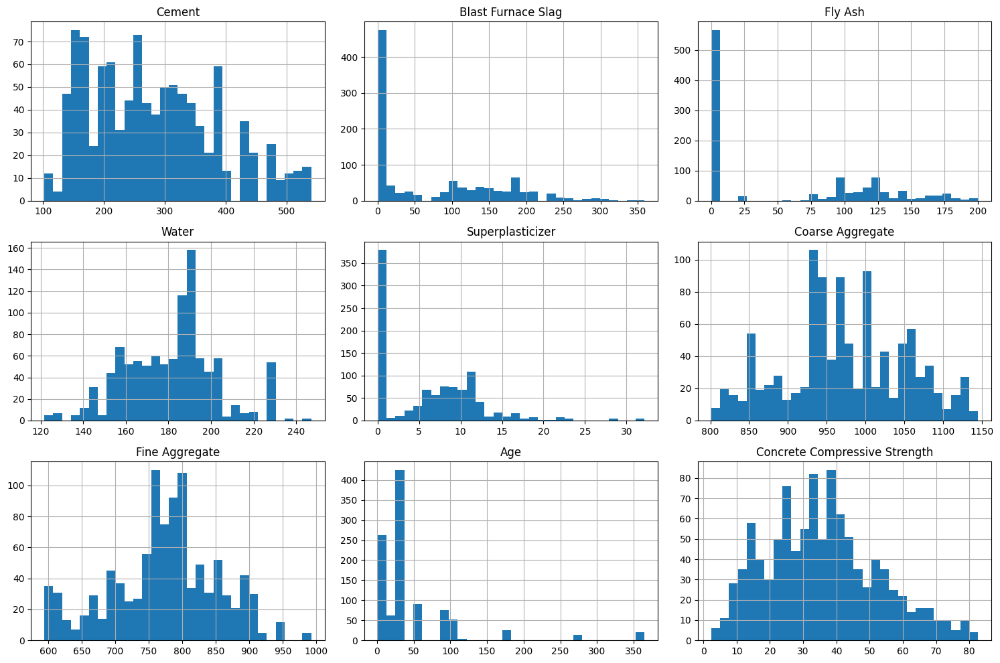

In [25]:
data.hist(figsize=(15, 10), bins=30)
plt.tight_layout()
plt.show()

In [26]:
def plot_concrete_data(data, target):
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
    fig.suptitle('Concrete compressive strength by other parameters')

    parameters = data.drop(columns=[target])  # All columns except the target
    y_name = target  # The name of the target
    correlation = parameters.corrwith(data[y_name])
    
    for i, ax in enumerate(axes.flatten()):
        if i < len(parameters.columns):
            data.plot(x=parameters.columns[i], y=y_name, kind='scatter', ax=ax)
            ax.set_xlabel(parameters.columns[i])
            ax.set_ylabel(y_name)
            ax.set_title(f'Correlation: {correlation[parameters.columns[i]]:.2f}')
        else:
            fig.delaxes(ax)  # Remove empty subplots

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

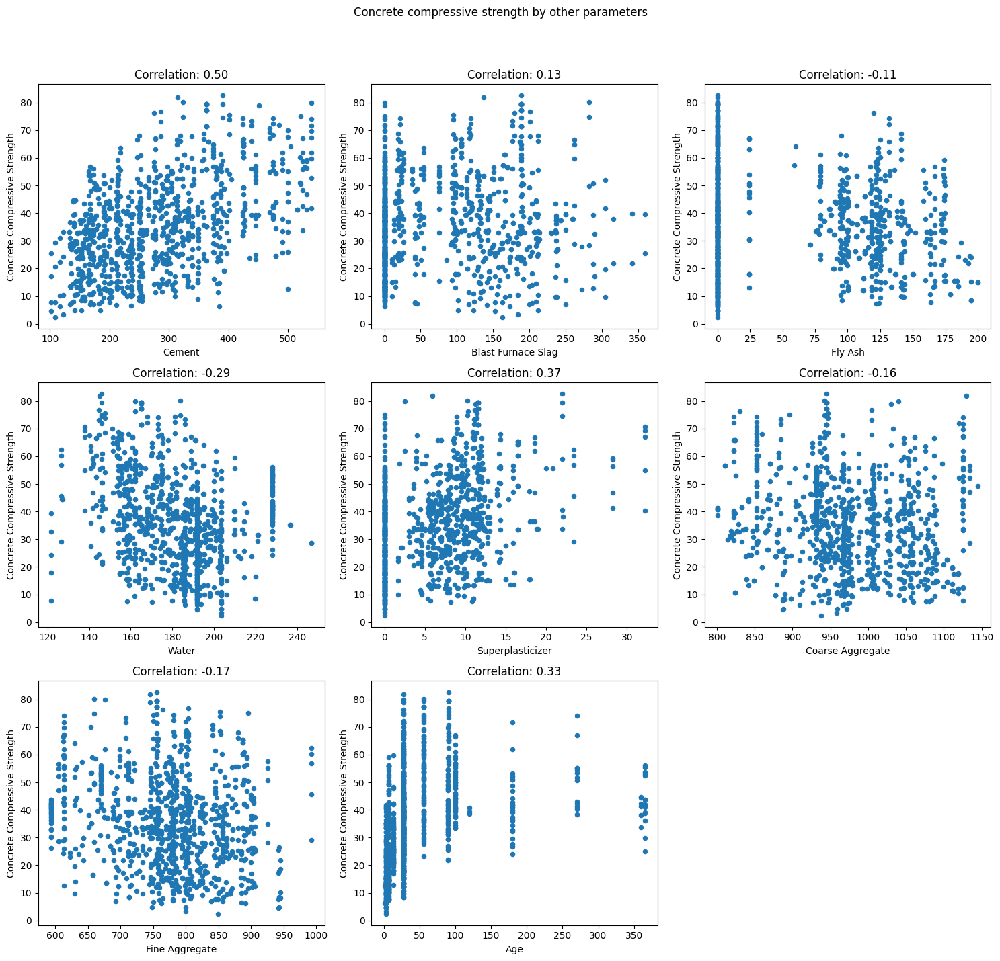

In [27]:
# Call the function
plot_concrete_data(data, target)

## Log transform

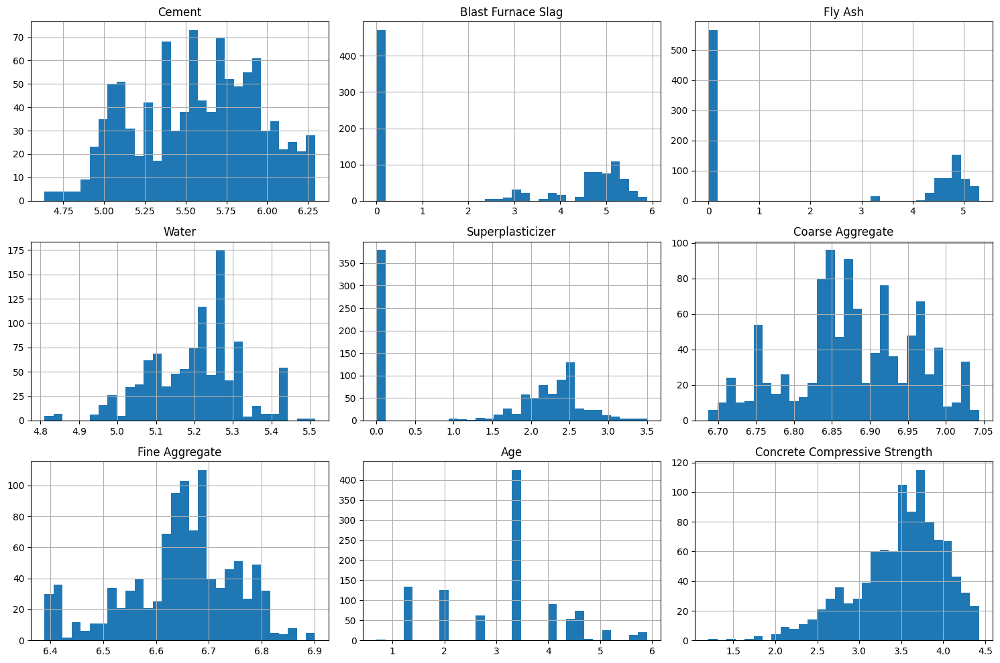

In [28]:
# Apply log transformation to the data
log_transformed_data = np.log1p(data)

log_transformed_data.hist(figsize=(15, 10), bins=30)
plt.tight_layout()
plt.show()

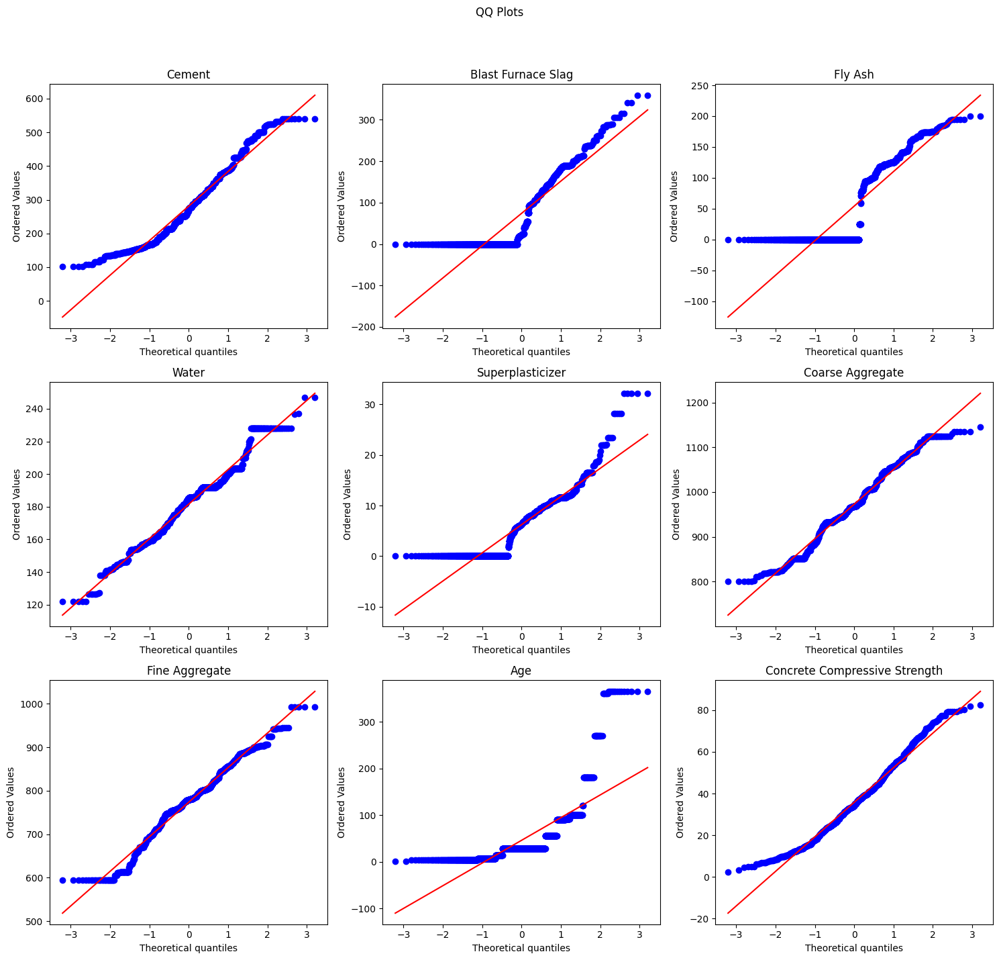

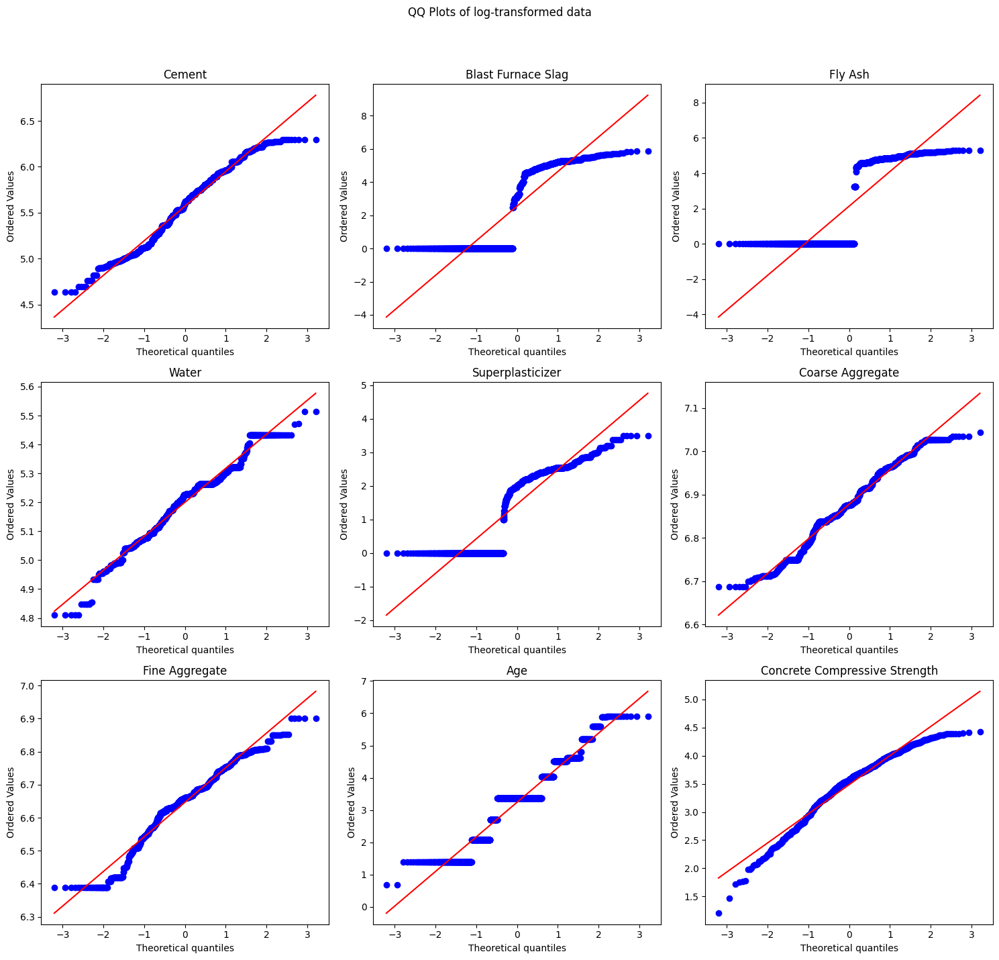

In [29]:
import scipy.stats as stats

def plot_qq_plots(data, title):
    # Create a figure with subplots
    num_attributes = len(data.columns)
    nrows = (num_attributes // 3) + (num_attributes % 3 > 0)
    ncols = 3
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
    fig.suptitle(title)

    # Ensure axes is always 2D
    axes = np.atleast_2d(axes)

    # Plot QQ plots for each attribute
    for i, column in enumerate(data.columns):
        row, col = divmod(i, 3)
        stats.probplot(data[column], dist="norm", plot=axes[row, col])
        axes[row, col].set_title(column)

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Call the function
plot_qq_plots(data, 'QQ Plots')
plot_qq_plots(log_transformed_data, "QQ Plots of log-transformed data")

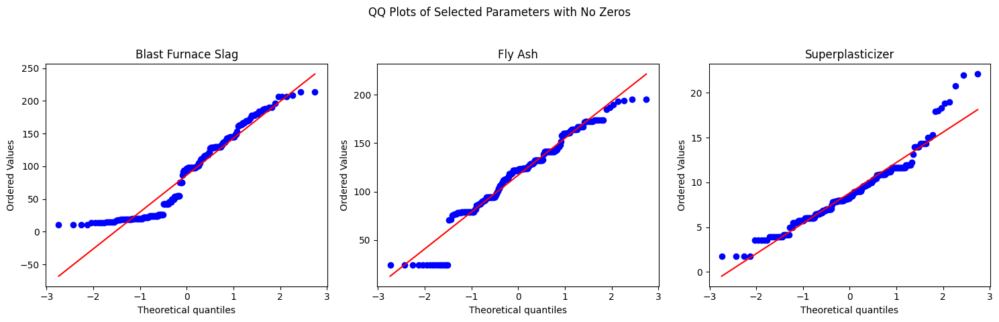

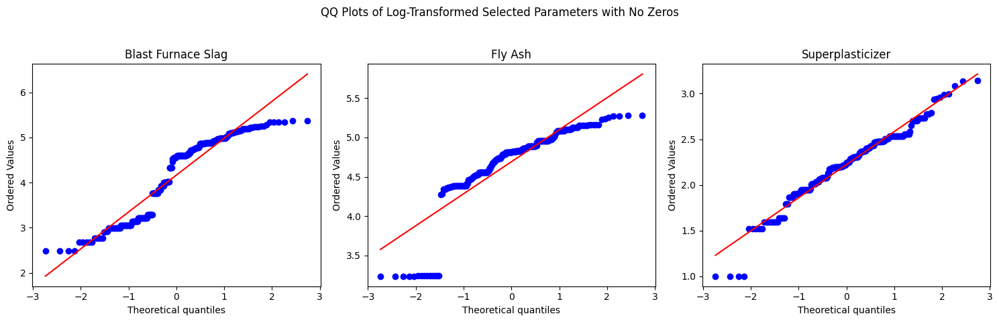

In [30]:
def remove_zeros(data,):
    filtered_data_no_zeros = data[(data != 0).all(axis=1)]
    return filtered_data_no_zeros



selected_parameters_with_zeros = ['Blast Furnace Slag', 'Fly Ash', 'Superplasticizer']
plot_qq_plots(remove_zeros(data[selected_parameters_with_zeros]), 'QQ Plots of Selected Parameters with No Zeros')
plot_qq_plots(remove_zeros(log_transformed_data[selected_parameters_with_zeros]), 'QQ Plots of Log-Transformed Selected Parameters with No Zeros')

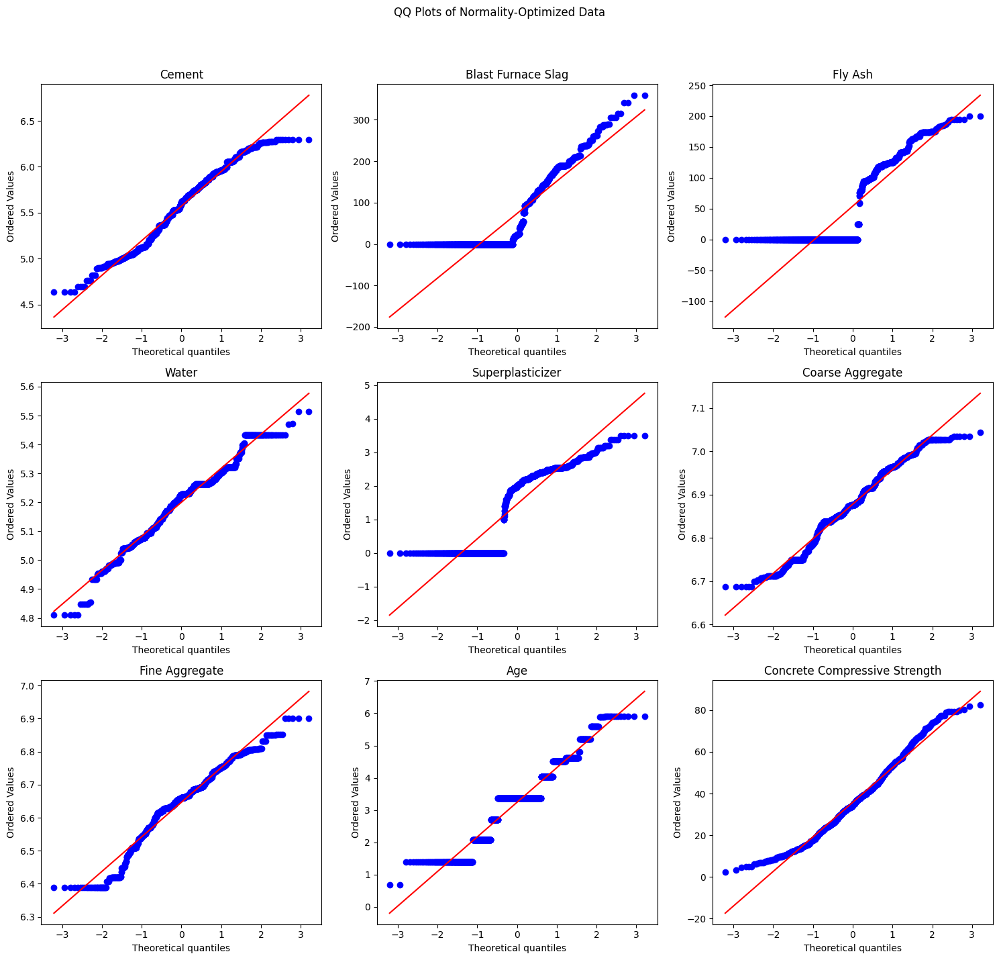

In [31]:
# Apply log transformation to the specified attributes
attributes_to_log_transform = ['Cement', 'Water', 'Superplasticizer', 'Coarse Aggregate', 'Fine Aggregate', 'Age']

normality_optimized_data = data.copy()
for attribute in attributes_to_log_transform:
    normality_optimized_data[attribute] = np.log1p(normality_optimized_data[attribute])
    
plot_qq_plots(normality_optimized_data, 'QQ Plots of Normality-Optimized Data')

# Path to normal distributions

# Correlation

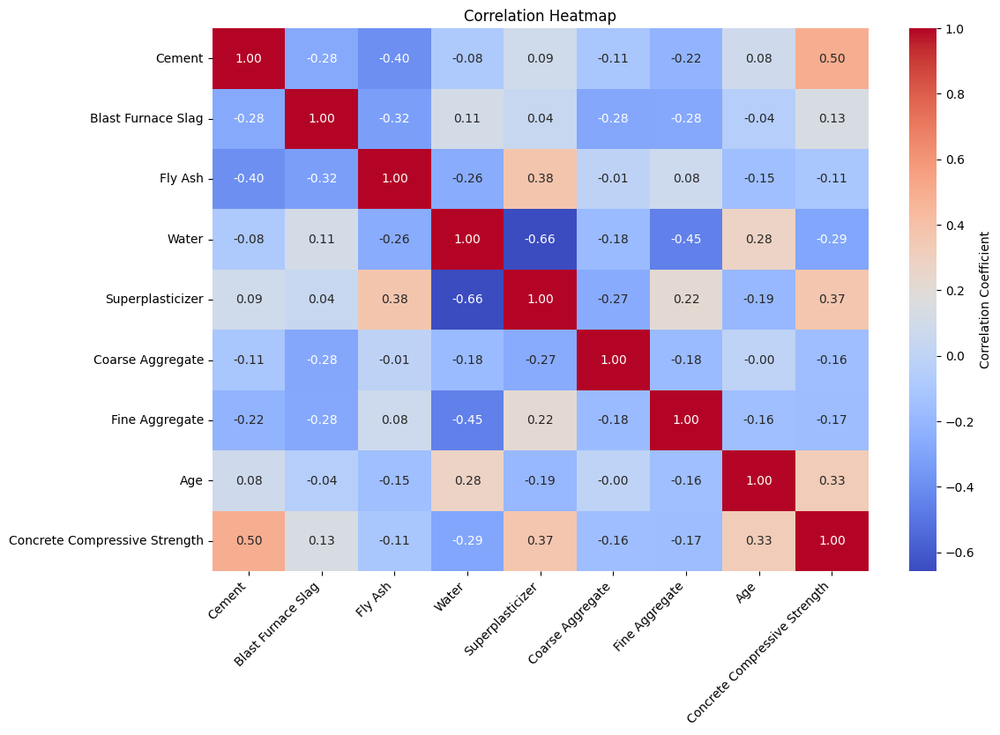

In [32]:
import seaborn as sns

# Calculate the correlation matrix
correlation_matrix = data.corr()

# Plot the heatmap with annotations
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'label': 'Correlation Coefficient'})
plt.xticks(rotation=45, ha='right')
plt.title('Correlation Heatmap')
plt.show()


# Principal Component Analysis (PCA)

Principal Component Analysis (PCA) is a dimensionality reduction technique that transforms correlated features into a smaller number of uncorrelated features called principal components. It does so by finding new axes that maximize variance. Below are the mathematical steps involved in PCA:

## Step 1: Standardization (Mean-Centering and Scaling)
Since PCA is affected by the scale of variables, it is standard practice to standardize the data.

Given a dataset \( X \) with \( n \) observations and \( p \) features:

1. Compute the mean for each feature:
\[ \mu_j = \frac{1}{n} \sum_{i=1}^{n} X_{ij}, \quad j = 1, 2, \ldots, p \]

2. Center the data by subtracting the mean:
\[ X_{ij}' = X_{ij} - \mu_j \]

3. Optionally, scale the data to unit variance:
\[ X_{ij}'' = \frac{X_{ij}'}{\sigma_j}, \quad \text{where} \quad \sigma_j = \sqrt{\frac{1}{n-1} \sum_{i=1}^{n} (X_{ij}')^2} \]

This ensures that all features have a mean of 0 and variance of 1.

## Step 2: Compute the Covariance Matrix
The covariance matrix measures the relationships between different features.

Construct the covariance matrix:
\[ \Sigma = \frac{1}{n-1} X^T X \]
where \( X \) is the standardized data matrix of shape \( n \times p \).

The covariance between two features \( X_j \) and \( X_k \) is:
\[ \text{Cov}(X_j, X_k) = \frac{1}{n-1} \sum_{i=1}^{n} X_{ij}'' X_{ik}'' \]

## Step 3: Compute the Eigenvalues and Eigenvectors
To find the principal components, we solve the eigenvalue problem for the covariance matrix.

Solve the characteristic equation:
\[ |\Sigma - \lambda I| = 0 \]
where:
- \( \lambda \) are the eigenvalues (representing the variance explained by each principal component),
- \( I \) is the identity matrix.

Compute the corresponding eigenvectors \( v \) satisfying:
\[ \Sigma v = \lambda v \]
Each eigenvector represents a principal component direction in feature space.

## Step 4: Select Principal Components
1. Sort the eigenvalues \( \lambda_1 \geq \lambda_2 \geq \cdots \geq \lambda_p \) in decreasing order.
2. Choose the top \( k \) eigenvectors corresponding to the largest \( k \) eigenvalues.
3. Form the projection matrix \( W \) of shape \( p \times k \), where each column is an eigenvector:
\[ W = [v_1, v_2, \ldots, v_k] \]

## Step 5: Transform the Data
Project the original data onto the new subspace:
\[ Z = X W \]
where:
- \( X \) is the standardized data matrix (\( n \times p \)),
- \( W \) is the eigenvector matrix (\( p \times k \)),
- \( Z \) is the transformed data (\( n \times k \)), representing the dataset in the new lower-dimensional space.

## Step 6: Explained Variance and Reconstruction
1. Compute the explained variance for each principal component:
\[ \text{Explained Variance Ratio} = \frac{\lambda_i}{\sum_{j=1}^{p} \lambda_j} \]
This helps determine how much variance each principal component captures.

2. If needed, reconstruct the original data from the principal components:
\[ \hat{X} = Z W^T \]
This step is useful if you want to approximate the original data using fewer dimensions.

## Summary
PCA mathematically involves:
- Standardizing the data (mean-centering and optionally scaling).
- Computing the covariance matrix to measure feature relationships.
- Solving the eigenvalue problem to obtain principal components.
- Selecting the top \( k \) components based on eigenvalues.
- Projecting the original data onto the new feature space.

This reduces dimensionality while preserving the most significant variance in the data.

Eigenvalues: [2.27988839 1.41621134 1.34024303 1.01415438 0.95160179 0.79013022
 0.17772856 0.03004229]
Explained Variance Ratio: [0.28498605 0.17702642 0.16753038 0.1267693  0.11895022 0.09876628
 0.02221607 0.00375529]
Cumulative Explained Variance Ratio: [0.28498605 0.46201247 0.62954284 0.75631214 0.87526237 0.97402864
 0.99624471 1.        ]


,Cement,Water,Superplasticizer,Age,Fine Aggregate,Coarse Aggregate,Fly Ash,Blast Furnace Slag
0,-0.098273,-0.177253,0.394642,-0.547054,0.505917,-0.038056,0.401906,-0.291522
1,0.111810,-0.685624,0.143800,-0.052921,-0.283604,0.630341,0.019569,0.125678


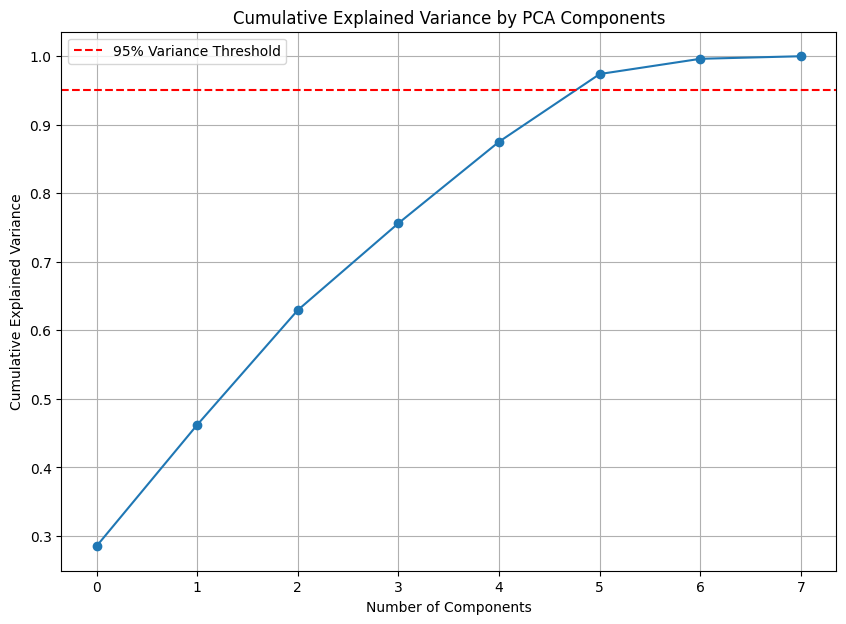

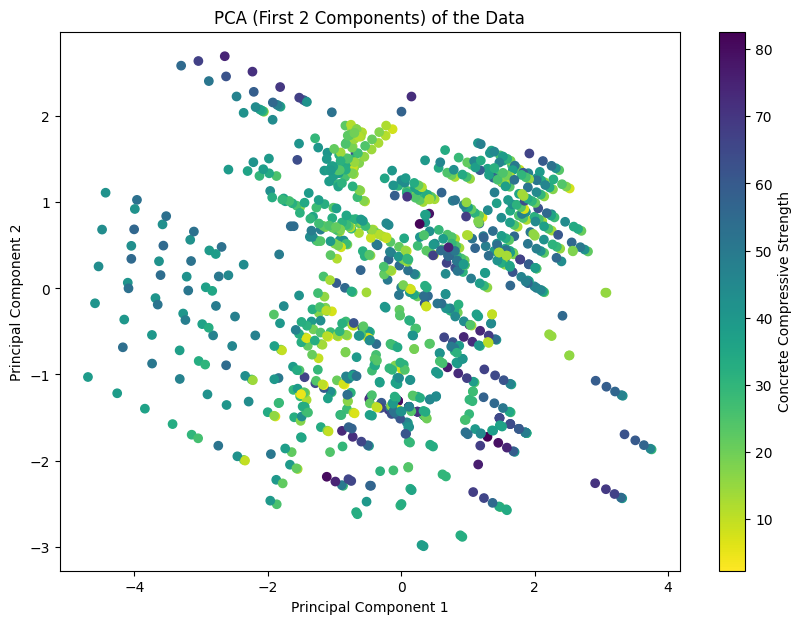

In [33]:
def plot_PCA(data, target):
    X = data.drop(columns=[target])
    y = data[target]

    # Step 1: Standardization (Mean-Centering and Scaling)
    # Standardize the features
    # Manually standardize the features
    means = X.mean()
    stds = X.std()
    X_scaled = (X - means) / stds

    # Step 2: Compute the Covariance Matrix
    covariance_matrix = np.cov(X_scaled, rowvar=False)

    # Step 3: Compute the Eigenvalues and Eigenvectors
    eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

    # Step 4: Select Principal Components
    # Sort the eigenvalues and corresponding eigenvectors
    sorted_index = np.argsort(eigenvalues)[::-1]
    sorted_eigenvalues = eigenvalues[sorted_index]
    sorted_eigenvectors = eigenvectors[:, sorted_index]
    sorted_columns = X_scaled.columns[sorted_index]

    # Choose the top k eigenvectors (for example, k=2)
    k = 2
    eigenvector_subset = sorted_eigenvectors[:, 0:k]

    # Step 5: Transform the Data
    X_reduced = np.dot(X_scaled, eigenvector_subset)

    # Step 6: Explained Variance
    explained_variance_ratio = sorted_eigenvalues / np.sum(sorted_eigenvalues)
    explained_variance_ratio_cumsum = np.cumsum(explained_variance_ratio)

    # Print the results
    print("Eigenvalues:", sorted_eigenvalues)
    print("Explained Variance Ratio:", explained_variance_ratio)
    print("Cumulative Explained Variance Ratio:", explained_variance_ratio_cumsum)
    display(pd.DataFrame(eigenvector_subset.T, columns=sorted_columns))

    # Optionally, plot the explained variance ratio
    plt.figure(figsize=(10, 7))
    plt.plot(explained_variance_ratio_cumsum, marker='o', linestyle='-')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('Cumulative Explained Variance by PCA Components')
    plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance Threshold')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Optionally, visualize the first two principal components
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y, cmap='viridis_r')
    plt.colorbar(label=target)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.title('PCA (First 2 Components) of the Data')

    # Add hover functionality to display inverse transformed data
    annot = plt.gca().annotate("", xy=(0,0), xytext=(20,20),
                               textcoords="offset points",
                               bbox=dict(boxstyle="round", fc="w"),
                               arrowprops=dict(arrowstyle="->"))
    annot.set_visible(False)
    
    def inverse_transform_pca(pca_components, data):
        list_data = np.dot(data, pca_components.T)[0]
        data_text = "\n".join([f"{col}: {np.round(val, 2)}" for col, val in zip(sorted_columns, list_data)])
        return f"Original Data:\n{data_text}"

    def update_annot(ind):
        pos = scatter.get_offsets()[ind["ind"][0]]
        annot.xy = pos
        index = ind["ind"][0]
        text = inverse_transform_pca(eigenvector_subset, X_reduced[index].reshape(1, -1))
        annot.set_text(text)
        annot.get_bbox_patch().set_alpha(0.4)

    def hover(event):
        vis = annot.get_visible()
        if event.inaxes == plt.gca():
            cont, ind = scatter.contains(event)
            if cont:
                update_annot(ind)
                annot.set_visible(True)
                plt.gcf().canvas.draw_idle()
            else:
                if vis:
                    annot.set_visible(False)
                    plt.gcf().canvas.draw_idle()

    plt.gcf().canvas.mpl_connect("motion_notify_event", hover)
    plt.show()
plot_PCA(data, target)

Original data shape: (1030, 9)
Data shape after removing outliers: (941, 9)
Eigenvalues: [2.12102168 1.40491955 1.2776243  1.06549005 0.98728344 0.93756572
 0.17616266 0.0299326 ]
Explained Variance Ratio: [0.26512771 0.17561494 0.15970304 0.13318626 0.12341043 0.11719571
 0.02202033 0.00374157]
Cumulative Explained Variance Ratio: [0.26512771 0.44074265 0.60044569 0.73363195 0.85704238 0.97423809
 0.99625843 1.        ]


,Cement,Water,Superplasticizer,Age,Fine Aggregate,Coarse Aggregate,Fly Ash,Blast Furnace Slag
0,-0.119787,-0.249761,0.475800,-0.538567,0.526525,-0.001294,0.350631,0.081596
1,0.300695,-0.663515,-0.043032,-0.077578,-0.302198,0.607253,0.017772,0.032621


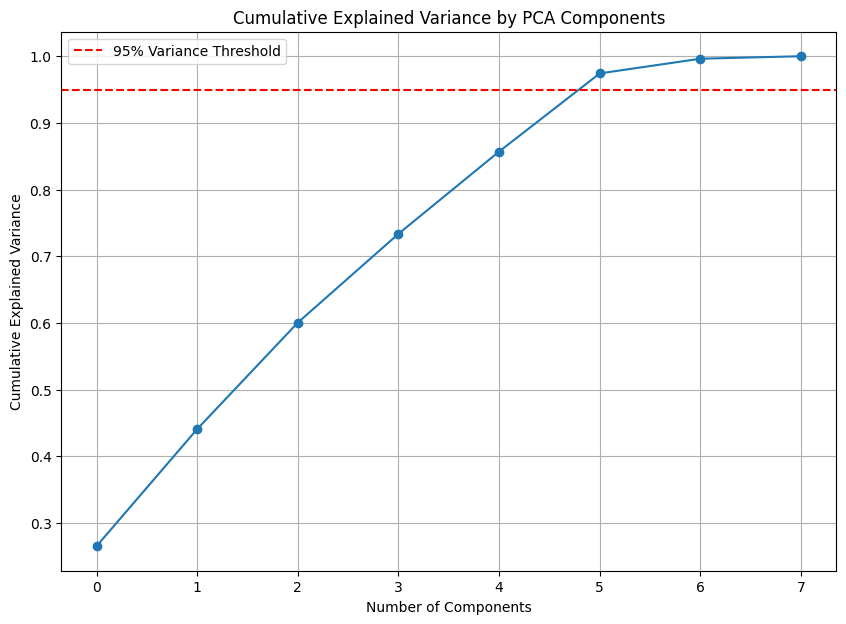

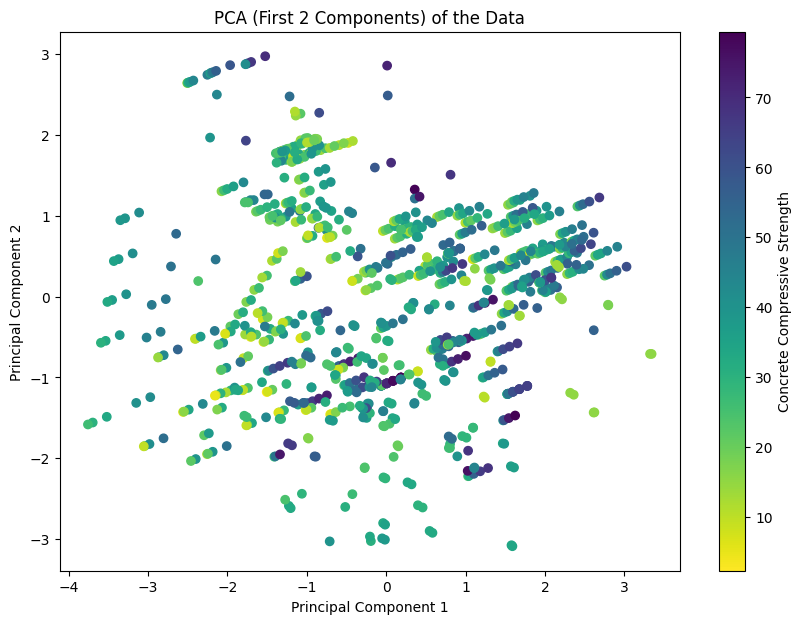

In [34]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = standardized_data.quantile(0.25)
Q3 = standardized_data.quantile(0.75)

# Calculate the IQR
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the rows where any feature is outside the bounds
data_no_outliers = data[~((standardized_data < lower_bound) | (standardized_data > upper_bound)).any(axis=1)]

# Display the shape of the new dataset
print("Original data shape:", standardized_data.shape)
print("Data shape after removing outliers:", data_no_outliers.shape)
plot_PCA(data_no_outliers, target)

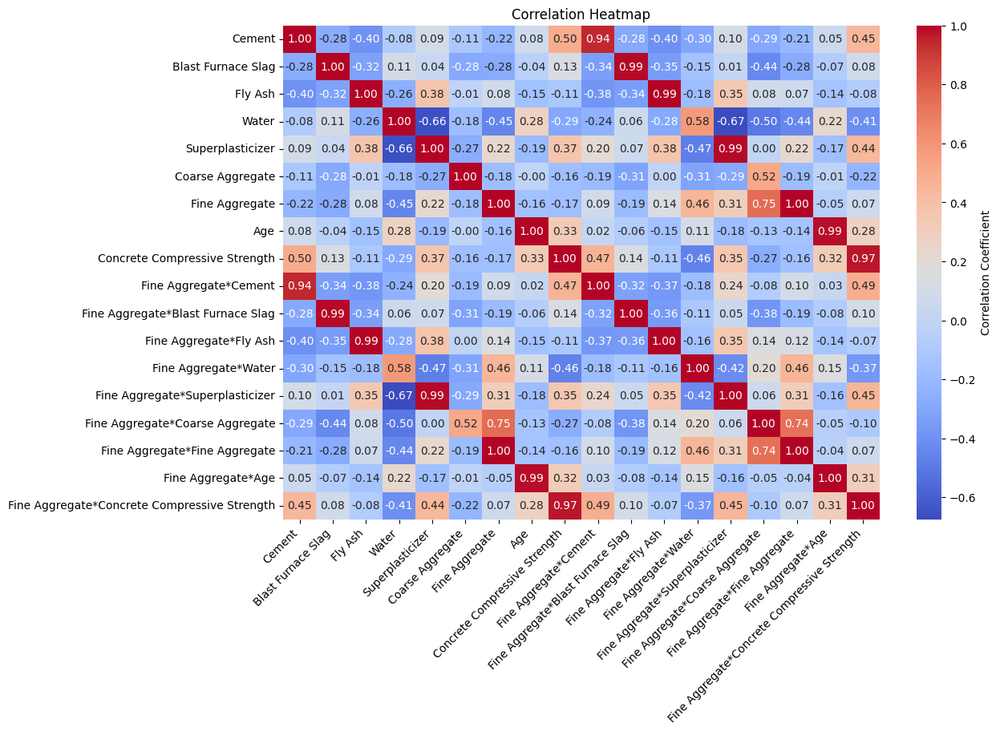

In [35]:
import seaborn as sns

# Create a dataframe with multiplied attributes
multiplied_parameters = pd.DataFrame()

# Iterate over each pair of columns and multiply them
for i, col1 in enumerate(["Fine Aggregate"]):
    for j, col2 in enumerate(data.columns):
        if i <= j:  # To avoid duplicate pairs and self-multiplication
            multiplied_parameters[f'{col1}*{col2}'] = data[col1] * data[col2]

# Concatenate the original data with the multiplied parameters
data_with_multiplied = pd.concat([data, multiplied_parameters], axis=1)


# Calculate the correlation matrix
correlation_matrix = data_with_multiplied.corr()
# Plot the heatmap with annotations
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'label': 'Correlation Coefficient'})
plt.xticks(rotation=45, ha='right')
plt.title('Correlation Heatmap')
plt.show()


In [36]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Create new features by combining existing ones
extended_data = standardized_data.copy()
# extended_data['Cement_Water'] = extended_data['Cement'] * extended_data['Water']
# extended_data['Cement_Age'] = extended_data['Cement'] * extended_data['Age']
# extended_data['Water_Age'] = extended_data['Water'] * extended_data['Age']
# extended_data['Superplasticizer_Age'] = extended_data['Superplasticizer'] * extended_data['Age']
# extended_data['Cement_Superplasticizer'] = extended_data['Cement'] * extended_data['Superplasticizer']
# extended_data['Cement^2'] = extended_data['Cement'] ** 2
# extended_data['Water^2'] = extended_data['Water'] ** 2
# extended_data['Superplasticizer^2'] = extended_data['Superplasticizer'] ** 2
# extended_data['Age^2'] = extended_data['Age'] ** 2

# Add squared parameters to the extended_data
for attribute in attributes_to_log_transform:
    extended_data[f'{attribute}^2'] = extended_data[attribute] ** 2

# Add interaction terms to the extended_data
for i, col1 in enumerate(extended_data.columns):
    for j, col2 in enumerate(extended_data.columns):
        if i < j:  # To avoid duplicate pairs and self-multiplication
            extended_data[f'{col1}_{col2}'] = extended_data[col1] * extended_data[col2]

# Split the data into training and testing sets
X = extended_data.drop(columns=[target])
y = extended_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

# Display the coefficients
coefficients = pd.DataFrame(model.coef_, X.columns, columns=['Coefficient'])
print(coefficients)

C:\Users\Adrian- Admin\AppData\Local\Temp\ipykernel_8840\1285514695.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  extended_data[f'{col1}_{col2}'] = extended_data[col1] * extended_data[col2]
C:\Users\Adrian- Admin\AppData\Local\Temp\ipykernel_8840\1285514695.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  extended_data[f'{col1}_{col2}'] = extended_data[col1] * extended_data[col2]
C:\Users\Adrian- Admin\AppData\Local\Temp\ipykernel_8840\1285514695.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usua

KeyboardInterrupt: 